# **<font color = red>Figures and analysis</font>** 

This notebook contains scripts for producing the main figures and results accompanying the manuscript. Here we perform basic organization and processing of data, which is then passed to functions in **figures.py** (available at this GitHub repository) for detailed formatting. The figures produced are stored as PDFs in the **/figures** folder.

## **Contents**

- ### [Libraries and variables](#lib)
- ### [Figure 1. MPL recovers time-varying selection for a 10-site model without the binary trait](#Figure_1)
- ### [Figure 2. The distribution of inferred time-varying selection coefficients for 100 replicating simulations](#Figure_1)
- ### [Figure 3. MPL recovers time-varying selection for a 20-site model with a binary trait](#Figure_3)
- ### [Figure 4. Time varying trait coefficients for HIV data example](#Figure_4)

- ### [Supplementary Figure. Inference results with different $\gamma^{\prime}$](#su:Figure_gamma_t)
- ### [Supplementary Figure. The distribution of all inferred coefficients for 100 replicating simulations](#su:Figure_dis)
- ### [Supplementary Figure. Inference result for a single mutation](#su:Figure_single)
- ### [Supplementary Figure. Time varying trait coefficients for all HIV data  ](#su:Figure_all)
- ### [Supplementary Figure. Time varying trait coefficients for HIV data CH077-3](#su:Figure_CH077-3)
- ### [Supplementary Figure. Time varying trait coefficients for HIV data CH256-5](#su:Figure_CH256-5)
- ### [Supplementary Figure. Time varying trait coefficients for HIV data CH470-5](#su:Figure_CH470-5)
- ### [Supplementary Figure. Short time vs long time](#su:Figure_time)


<a id='lib'></a>
### Libraries and variables

In [3]:
# Full library list and version numbers

print('This notebook was prepared using:')

import sys, os
from copy import deepcopy
from importlib import reload
print('python version %s' % sys.version)

import numpy as np
print('numpy version %s' % np.__version__)

import scipy as sp
print('scipy version %s' % sp.__version__)

import pandas as pd
print('pandas version %s' % pd.__version__)

import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
print('matplotlib version %s' % matplotlib.__version__)

import seaborn as sns
import re
import math
from dataclasses import dataclass
import json

import importlib
import figures as fig
import mplot as mp

# GitHub directories
HIV_DIR = 'data/HIV'
MPL_DIR = 'src/MPL'
SIM_DIR = 'data/simulation'
FIG_DIR = 'figures'

# Standard color scheme

BKCOLOR  = '#252525'
C_BEN    = '#EB4025'
C_BEN_LT = '#F08F78'
C_NEU    = '#969696'
C_NEU_LT = '#E8E8E8'
C_DEL    = '#3E8DCF'
C_DEL_LT = '#78B4E7'

# paper style
FONTFAMILY   = 'Arial'
SIZESUBLABEL = 8
SIZELABEL    = 6
SIZETICK     = 6
SMALLSIZEDOT = 6.
SIZELINE     = 0.6

GOLDR        = (1.0 + np.sqrt(5)) / 2.0
TICKLENGTH   = 3
TICKPAD      = 3
AXWIDTH      = 0.4

FIGPROPS = {
    'transparent' : True,
    #'bbox_inches' : 'tight'
}

DEF_ERRORPROPS = {
    'mew'        : AXWIDTH,
    'markersize' : SMALLSIZEDOT/2,
    'fmt'        : 'o',
    'elinewidth' : SIZELINE/2,
    'capthick'   : 0,
    'capsize'    : 0
}

DEF_LABELPROPS = {
    'family' : FONTFAMILY,
    'size'   : SIZELABEL,
    'color'  : BKCOLOR
}

DEF_SUBLABELPROPS = {
    'family'  : FONTFAMILY,
    'size'    : SIZESUBLABEL+1,
    'weight'  : 'bold',
    'ha'      : 'center',
    'va'      : 'center',
    'color'   : 'k',
    'clip_on' : False
}

This notebook was prepared using:
python version 3.10.9 | packaged by conda-forge | (main, Feb  2 2023, 20:26:08) [Clang 14.0.6 ]
numpy version 1.24.2
scipy version 1.10.1
pandas version 1.5.3
matplotlib version 3.7.1


<a id='Figure_1'></a>
### Figure 1. MPL recovers time-varying selection for  a 10-site  model without the binary trait
2 beneficial mutations 0.02, 2 delterious mutations -0.02, \
4 time-varying mutations (2 sin and 2 cos)

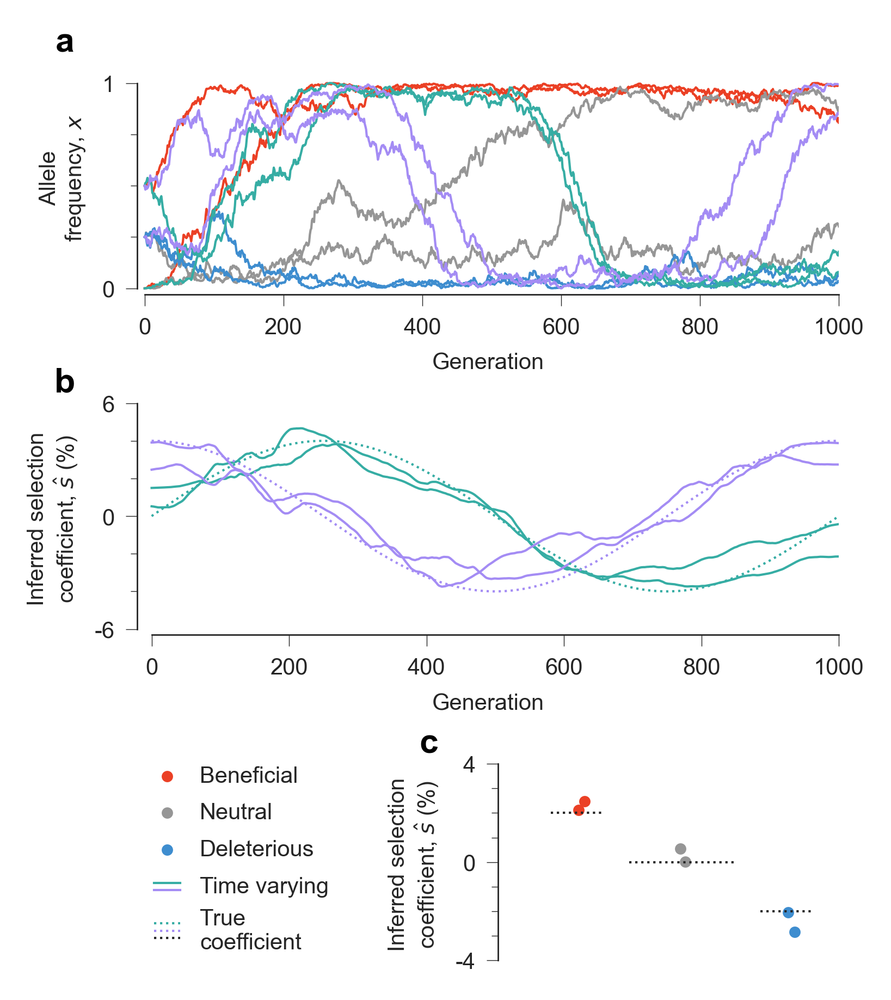

In [11]:
import importlib
importlib.reload(fig)

'Typical case'
generations = 1000
fi_1 = np.zeros(generations+1)
fi_2 = np.zeros(generations+1)

for t in range(len(fi_1)):
    fi_1[t] = np.sin(t*2*np.pi/generations)*0.04
    fi_2[t] = np.cos(t*2*np.pi/generations)*0.04
    
k = 10

pdata = {  
    'NUC':           ['A', 'T'],      # all possible alleles
    'sim_dir':       'simple',        # directory of this simulation
    'output':        'output',              # suffix of output directory
    'name':          str(k),          # output file name
    'seq_length':    10,              # sequence length
    'pop_size':      1000,            # population size
    'generations':   generations,     # number of total generations
    'bene':          [0,1],           # constant beneficial mutations sites
    'dele':          [4,5],           # constant deleterious mutations sites
    'p_1':           [6,7],           # time-varying mutations sites (sin)
    'p_2':           [8,9],           # time-varying mutations sites (cos)
    's_ben':         0.02,            # selection coefficient of beneficial mutations
    's_del':         -0.02,           # selection coefficient of deleterious mutations
    'fi_1':          fi_1,            # time-varying selection coefficient for individual site (sin)
    'fi_2':          fi_2,            # time-varying selection coefficient for individual site (cos)
    'savepdf':       True,            # True: save as pdf; False: save as png in another directory
    'ytick_t':       [-0.06,0,0.06],
    'yminorticks_t': [-0.04,-0.02,0.02,0.04],
    }

fig.plot_simple(**pdata)
plt.show()

In [3]:
'''Plot figures for all cases'''
importlib.reload(fig)

n_sim = 100
pdata['savepdf'] = False
for k in range(n_sim):
    pdata['name']=str(k)
    fig.plot_simple(**pdata)
    plt.close()

<a id='Figure_2'></a>
### Figure 2. The distribution of inferred time-varying selection coefficients for 100 replicating simulations
Evolutionary path for a 10-site time-varying model without binary trait
2 beneficial mutations 0.02, 2 delterious mutations -0.02, \
4 time-varying mutations (2 sin and 2 cos)

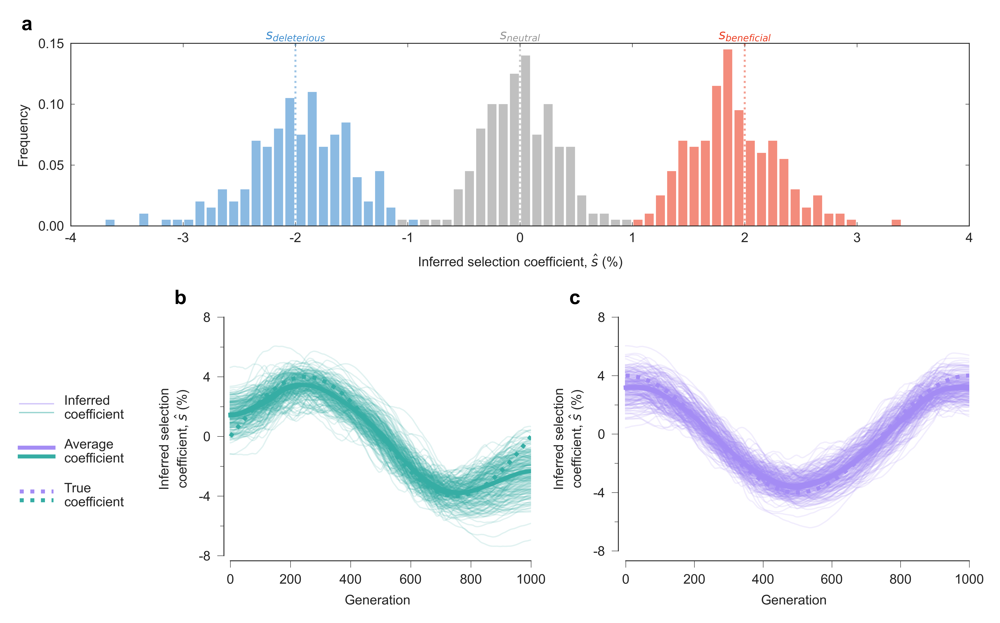

In [4]:
importlib.reload(fig)

'Binary case'
generations = 1000
fi_1 = np.zeros(generations+1)
fi_2 = np.zeros(generations+1)

for t in range(len(fi_1)):
    fi_1[t] = np.sin(t*2*np.pi/generations)*0.04
    fi_2[t] = np.cos(t*2*np.pi/generations)*0.04
    
pdata = {  
    'NUC':           ['A', 'T'],      # all possible alleles
    'sim_dir':       'simple',        # directory of this simulation
    'out_dir':       'output',        # suffix of output directory
    'beta':          4,
    'seq_length':    10,              # sequence length
    'pop_size':      1000,            # population size
    'generations':   generations,     # number of total generations
    'bene':          [0,1],           # constant beneficial mutations sites
    'dele':          [4,5],           # constant deleterious mutations sites
    'p_1':           [6,7],           # time-varying mutations sites (sin)
    'p_2':           [8,9],           # time-varying mutations sites (cos)
    's_ben':         0.02,            # selection coefficient of beneficial mutations
    's_del':         -0.02,           # selection coefficient of deleterious mutations
    'fi_1':          fi_1,            # time-varying selection coefficient for individual site (sin)
    'fi_2':          fi_2,            # time-varying selection coefficient for individual site (cos)
    'savepdf':       True,           # True: save as pdf;
    'xtick_h':       [ -0.04, -0.03, -0.02, -0.01,    0.,  0.01,  0.02,  0.03,  0.04],
    'ytick_h':       [0., 0.05, 0.10, 0.15],
    'ytick_t':       [-0.08,-0.04, 0, 0.04, 0.08],
    'yminorticks_t': [-0.06,-0.02,0.02,0.06],
    }

fig.plot_simple_his(**pdata)
plt.show()

<a id='su:Figure_gamma_t'></a>
### Supplementary Figure. Inference results with different $\gamma^{\prime}$
g is the value of $\gamma^{\prime}$ in the middle of the inference, which is 200 by default.

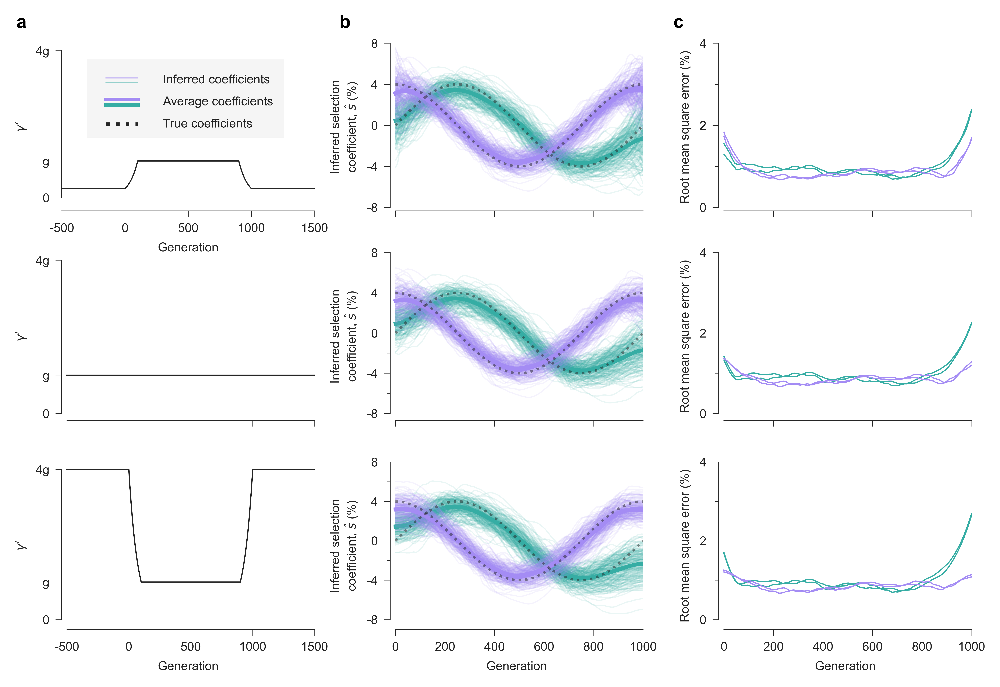

In [5]:
import importlib
importlib.reload(fig)

'Binary case'
generations = 1000
fi_1 = np.zeros(generations+1)
fi_2 = np.zeros(generations+1)

for t in range(len(fi_1)):
    fi_1[t] = np.sin(t*2*np.pi/generations)*0.04
    fi_2[t] = np.cos(t*2*np.pi/generations)*0.04
    
pdata = {  
    'NUC':           ['A', 'T'],      # all possible alleles
    'sim_dir':       'simple',        # directory of this simulation
    'seq_length':    10,              # sequence length
    'pop_size':      1000,            # population size
    'generations':   generations,     # number of total generations
    'bene':          [0,1],           # constant beneficial mutations sites
    'dele':          [4,5],           # constant deleterious mutations sites
    'p_1':           [6,7],           # time-varying mutations sites (sin)
    'p_2':           [8,9],           # time-varying mutations sites (cos)
    'fi_1':          fi_1,            # time-varying selection coefficient for individual site (sin)
    'fi_2':          fi_2,            # time-varying selection coefficient for individual site (cos)
    'savepdf':       True,           # True: save as pdf;
    'ytick_t':       [-0.08,-0.04, 0, 0.04, 0.08],
    'yminorticks_t': [-0.06,-0.02,0.02,0.06],
    'ytick_d':       [0, 0.02, 0.04],
    'yminorticks_d': [0.01,0.03],
    }

fig.plot_gamma_prime(**pdata)
plt.show()

<a id='Figure_3'></a>
### Figure 3. MPL recovers time-varying selection for a 20-site model with a binary trait
4 beneficial mutations 0.02, 4 delterious mutations -0.02, 2 time-varying mutations\
1 binary trait consisting of 3 random constant mutations

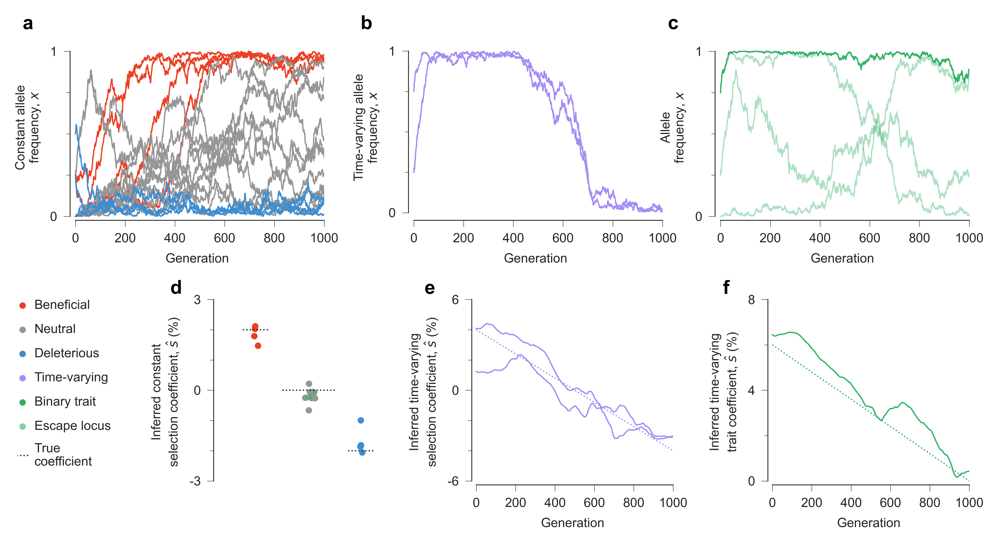

In [6]:
import importlib
importlib.reload(fig)

'Binary case'
generations = 1000
fn = np.zeros(generations+1)
fi = np.zeros(generations+1)

for t in range(len(fn)):
    fi[t] = 0.04 - 0.08/generations * t
    fn[t] = 0.06 - 0.06/generations * t

trait_dir = 'trait'
with open("%s/%s/escape_groups.dat"%(SIM_DIR,trait_dir), 'r') as file:
    escape_groups = json.load(file)

k = 0

pdata = {  
    'NUC':           ['A', 'T'],       # all possible alleles
    'sim_dir':       trait_dir,        # directory of this simulation
    'output':        '',
    'name':          str(k),           # output file name
    'seq_length':    20,               # sequence length
    'pop_size':      1000,             # population size
    'generations':   generations,      # number of total generations
    'bene':          [0,1,2,3],        # constant beneficial mutations sites
    'dele':          [16,17,18,19],    # constant deleterious mutations sites
    's_ben':         0.02,             # selection coefficient of beneficial mutations
    's_del':         -0.02,            # selection coefficient of deleterious mutations
    'escape_group':  escape_groups[k], # escape sites
    'p_sites':       [9,10],           # special sites (not escape sites but still time-varying)
    'fn':            fn,               # time-varying selection coefficient
    'fi':            fi,               # time-varying selection coefficient
    'savepdf':       True,
    'ytick_e':       [0, 0.04, 0.08],
    'yminorticks_e': [0.02,0.06],
    'ytick_f':       [-0.06,0,0.06],
    'yminorticks_f': [-0.04, -0.02, 0.02, 0.04],
    }

fig.plot_trait(**pdata)
plt.show()

In [7]:
'Plot figures for all cases'
n_sim = 100
pdata['savepdf'] = False
for k in range(n_sim):
    pdata['name']=str(k)
    pdata['escape_group']=escape_groups[k]
    fig.plot_trait(**pdata)
    plt.close()

<a id='su:Figure_dis'></a>
### Supplementary Figure. The distribution of all inferred time-varying coefficients for 100 replicating simulations 
4 beneficial mutations 0.02, 4 delterious mutations -0.02, 2 time-varying mutations\
1 binary trait consisting of 3 random constant mutations

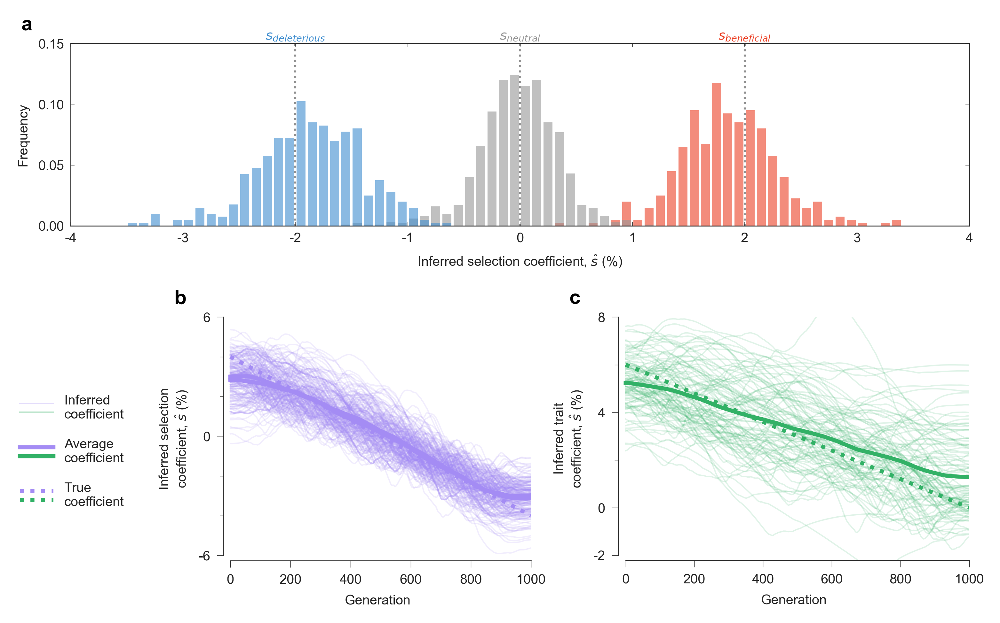

In [12]:
importlib.reload(fig)
trait_dir = 'trait'

pdata = {  
    'NUC':           ['A', 'C'],      # all possible alleles  
    'sim_dir':       trait_dir,        # directory of this simulation
    'output':        '',
    'seq_length':    20,              # sequence length
    'pop_size':      1000,            # population size
    'generations':   generations,     # number of total generations
    'n_ben':         4,               # number of beneficial mutations
    'n_del':         4,               # number of deleterious mutations
    's_ben':         0.02,            # selection coefficient of beneficial mutations
    's_del':         -0.02,           # selection coefficient of deleterious mutations
    'p_sites':       [9,10],           # special sites (not escape sites but still time-varying)
    'fn':            fn,              # time-varying selection coefficient
    'fi':            fi,              # time-varying selection coefficient
    'savepdf':       True,
    'xtick_h':       [ -0.04, -0.03, -0.02, -0.01,    0.,  0.01,  0.02,  0.03,  0.04],
    'ytick_h':       [0., 0.05, 0.10, 0.15],
    'ytick_f':       [-0.06,0,0.06],
    'yminorticks_f': [-0.04,-0.02,0.02,0.04],
    'ytick_e':       [-0.02, 0, 0.04, 0.08],
    'yminorticks_e': [ 0.02, 0.06],
    }

fig.plot_trait_his(**pdata)
plt.show()

<a id='su:Figure_single'></a>
### Supplementary Figure. Inference result for a single mutation
case 1 : frequency increase linearly\
case 2 : sigmoidal increase

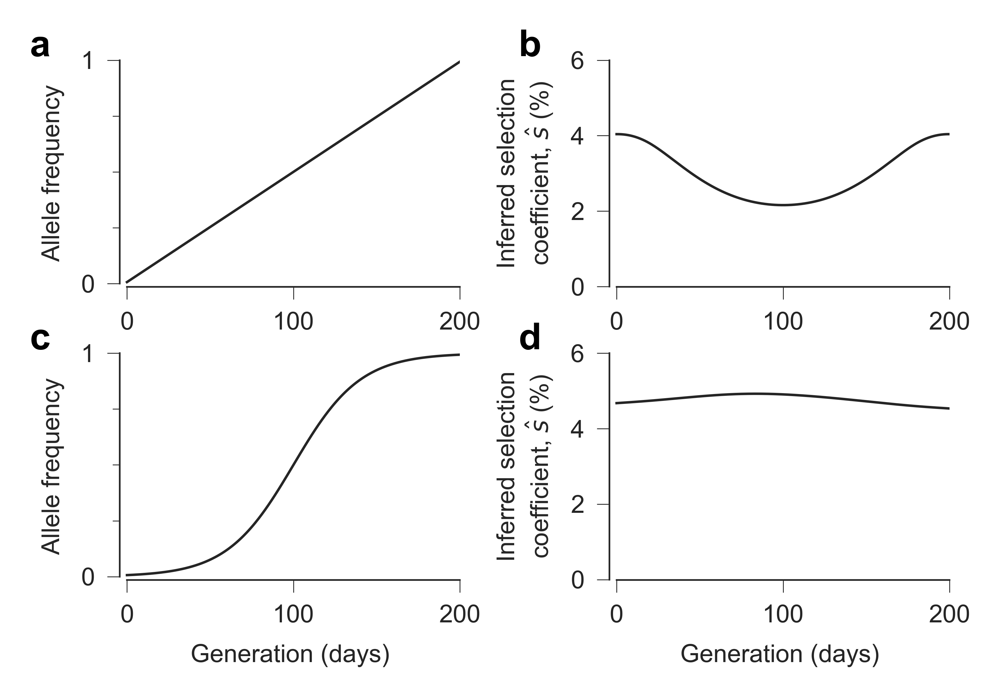

In [47]:
importlib.reload(fig)
'''New inference'''

x_1       = np.linspace(0.0,1,11)

pdata = {  
    'generations':   200,     # number of total generations
    's_coef':        0.05,    # selection coefficient 
    'savepdf':       True,
    }

fig.plot_single_mutation(**pdata)
plt.show()


<a id='Figure_4'></a>
### Figure 4. Time varying trait coefficients for HIV data example
left: CH256-3 RN9; right: CH040-3 AR9.

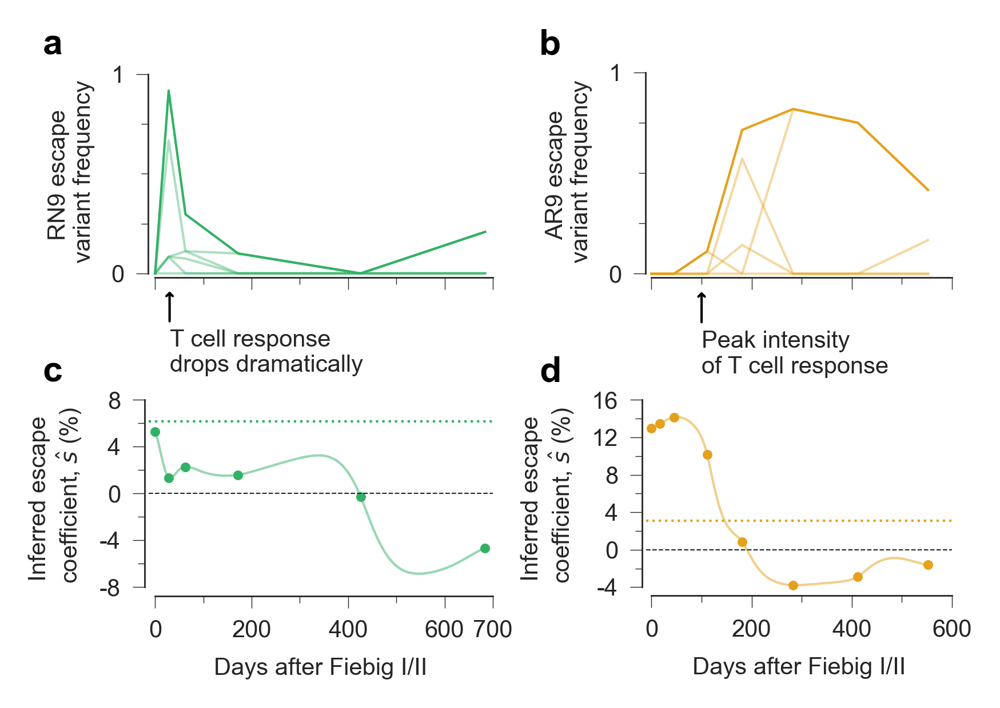

In [26]:
importlib.reload(fig)
'''Time-varying gamma_prime, middle value is 50'''

pdata = {                    
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [[0,200,400,600,700],[0,200,400,600]],
    'xminortick':[[100,300,500],[100,300,500]],
    'ytick':     [[-0.08, -0.04,    0, 0.04, 0.08],[-0.04,0,0.04,0.08,0.12,0.16]],
    'yminortick':[[-0.06, -0.02, 0.02, 0.06],[-0.02, 0.02,0.06,0.10,0.14]],
    'savepdf':   True,}

fig.plot_HIV(**pdata)

In [39]:
importlib.reload(fig)

pdata = {                    
    'tag':       '700010040-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'dir':       'output',               # input file name
    'xtick':     [],
    'xminortick':[],
    'ytick':     [],
    'yminortick':[],
    'ytick_sp':  [],
    'yminor_sp': [],
    'ytick_es':  [],
    'yminor_es': [],
    'savepdf':   False,
        }

infer_tags=['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
            '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
            '703010256-3','703010256-5','704010042-3','704010042-5','705010162-3','705010162-5',
            '705010185-5','705010198-3','706010164-3','706010164-5']


for tag in infer_tags:
    pdata['tag'] = tag
    fig.plot_traits(**pdata)
    plt.close()
    fig.plot_special_site(**pdata)
    plt.close()
    

CH040-3 has no special site
CH058-3 has no special site
CH077-3 has no special site
CH077-5 has no binary trait
CH607-3 has no special site
CH159-3 has no special site
CH042-3 has no special site
No data for CH162-3
No data for CH162-3
CH185-5 has no special site
CH198-3 has no special site
CH164-5 has no binary trait


In [38]:
importlib.reload(fig)

pdata = {                    
    'tag':       '700010040-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    'out_dir':       'output',               # input file name
    'xtick':     [],
    'xminortick':[],
    'ytick':     [],
    'yminortick':[],
    'ytick_sp':  [],
    'yminor_sp': [],
    'ytick_es':  [],
    'yminor_es': [],
    'savepdf':   False,
        }

infer_tags=['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
            '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
            '703010256-3','703010256-5','704010042-3','704010042-5','705010162-3','705010162-5',
            '705010185-5','705010198-3','706010164-3','706010164-5']


for tag in infer_tags:
    pdata['tag'] = tag
    fig.plot_traits_compare(**pdata)
    plt.close()
    # fig.plot_special_site_compare(**pdata)
    # plt.close()

CH077-5 has no binary trait
No new data for 162-3
CH164-5 has no binary trait


<a id='su:Figure_all'></a>
###  Supplementary Figure. Time varying trait coefficients for all HIV data   

CH077-5 does not contain any trait group
CH164-5 does not contain any trait group


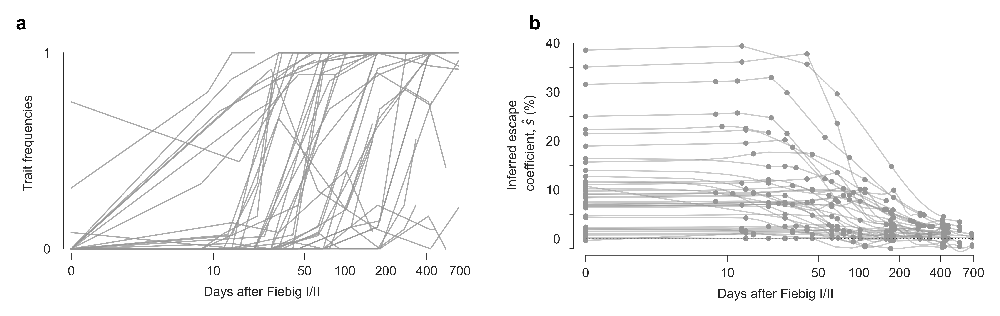

In [55]:
importlib.reload(fig)
'''Not UPDATE yet '''
C_NEU    = '#969696'

pdata = {                    
    'tags':   ['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
              '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
              '703010256-3','703010256-5','704010042-5','705010162-3','705010162-5',
              '705010185-5','705010198-3','706010164-3','706010164-5'],
    'dir':       'output',               # input file name
    'HIV_DIR':   'data/HIV',
    'name':      '',               # input file name
    'output':    '',               # output file name
}

fig.plot_all_epitopes(**pdata)
plt.show()


<a id='su:Figure_CH040-3'></a>
###  Supplementary Figure. Time varying trait coefficients for HIV data CH040-3

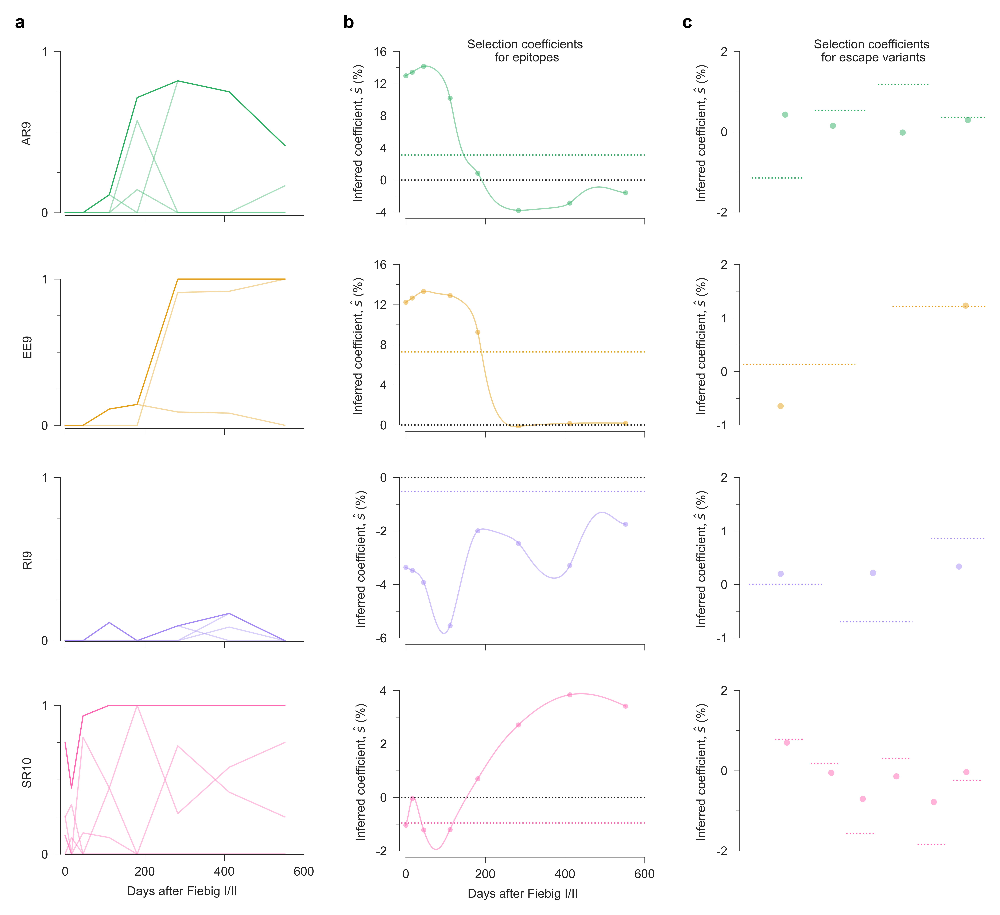

In [29]:
importlib.reload(fig)

pdata = {                    
    'tag':       '700010040-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    # 'dir':       'output',
    'xtick':     [0,200,400,600],
    'xminortick':[],
    'ytick':     [[-0.04, 0, 0.04, 0.08, 0.12, 0.16], [0, 0.04, 0.08, 0.12,0.16],\
                  [-0.06, -0.04, -0.02, 0], [-0.02, 0, 0.02, 0.04]],
    'yminortick':[[-0.02, 0.02, 0.06, 0.10,0.14], [0.02, 0.06, 0.10,0.14],\
                  [-0.05, -0.03, -0.01], [-0.01, 0.01, 0.03]],
    'ytick_es':  [[-0.02, 0, 0.02],[-0.01, 0, 0.01, 0.02],\
                  [-0.01, 0, 0.01, 0.02],[-0.02, 0, 0.02]],
    'yminor_es': [[-0.01, 0.01], [-0.005, 0.005, 0.015],\
                  [-0.005, 0.005, 0.015], [-0.01, 0.01]],
    'savepdf':   True,
        }

fig.plot_traits(**pdata)

<a id='su:Figure_CH256-3'></a>
###  Supplementary Figure. Time varying trait coefficients for HIV data CH256-3

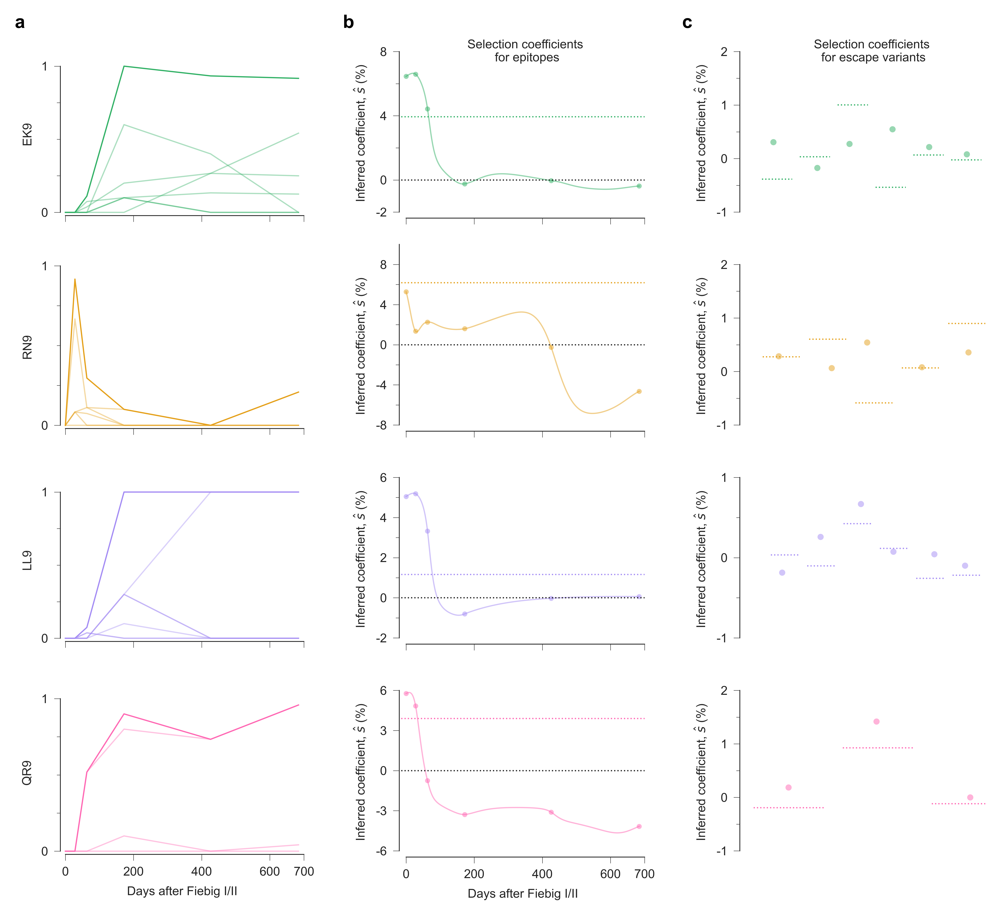

In [31]:
importlib.reload(fig)

pdata = {                    
    'tag':       '703010256-3',
    'HIV_DIR':   'data/HIV',
    'FIG_DIR':   'figures',
    # 'dir':       'output',
    'xtick':     [0,200,400,600,700],
    'xminortick':[],
    'ytick':     [[ -0.02, 0, 0.04, 0.08], [-0.08, -0.04, 0, 0.04, 0.08],\
                  [ -0.02, 0, 0.02, 0.04,0.06], [-0.06, -0.03, 0, 0.03, 0.06]],
    'yminortick':[[0.02, 0.06], [-0.06, -0.02, 0.02, 0.06, 0.10],\
                  [-0.01, 0.01, 0.03, 0.05], []],
    'ytick_es':  [[-0.01, 0, 0.01, 0.02],[-0.01, 0, 0.01, 0.02],\
                  [-0.01, 0, 0.01],[-0.01, 0, 0.01, 0.02]],
    'yminor_es': [[-0.005, 0.005, 0.015], [-0.005, 0.005, 0.015],\
                  [-0.005, 0.005], [-0.005, 0.005, 0.015]],
    'savepdf':   True,
        }

fig.plot_traits(**pdata)

#### CH058-3

<a id='su:Figure_time'></a>
###  Supplementary Figure. Short time vs long time

In [34]:
# importlib.reload(fig)

# pdata = {
#     'tag':       '700010040-3',
#     'HIV_DIR':   'data/HIV200',
#     'FIG_DIR':   'figures/HIV200',
#     'dir':       'output',               
#     'xtick':     [],
#     'xminortick':[],
#     'ytick':     [],
#     'yminortick':[],
#     'ytick_sp':  [],
#     'yminor_sp': [],
#     'savepdf':   False,
#         }

# tags_200 = ['700010470-3','700010470-5','703010159-3','703010256-3','703010256-5','704010042-3',
#             '704010042-5','705010162-3','705010162-5','706010164-3','706010164-5']
# for tag in tags_200:
#     pdata['tag'] = tag
#     fig.plot_epitope(**pdata)
#     plt.close()


In [35]:
# importlib.reload(fig)

# pdata = {
#     'tag':       '700010040-3',
#     'HIV_DIR':   'data/HIV250',
#     'FIG_DIR':   'figures/HIV250',
#     'dir':       'output',               
#     'xtick':     [],
#     'xminortick':[],
#     'ytick':     [],
#     'yminortick':[],
#     'ytick_sp':  [],
#     'yminor_sp': [],
#     'savepdf':   False,
#         }

# tags_250 = ['703010256-3','703010256-5','704010042-3','704010042-5',
#             '705010162-3','705010162-5','706010164-3','706010164-5']

# for tag in tags_250:
#     pdata['tag'] = tag
# #     fig.plot_epitope(**pdata)
#     plt.close()

different extended time

In [ ]:
# importlib.reload(fig)

# pdata = {
#     'tag':       '700010040-3',
#     'HIV_DIR':   'data/HIV',
#     'FIG_DIR':   'figures/HIV_nog',
#     'dir':       'output_nog',               
#     'xtick':     [],
#     'xminortick':[],
#     'ytick':     [],
#     'yminortick':[],
#     'ytick_sp':  [],
#     'yminor_sp': [],
#     'savepdf':   False,
#     'theta':     0.5,
#         }

# try_tags = ['700010040-3', '700010058-3','700010077-3','703010131-5','705010185-5']

# theta_range = [0.5, 2.0, 5.0, 10.0]

# for tag in try_tags:
#     pdata['tag'] = tag
#     for theta in theta_range:
#         pdata['theta'] = str(theta)
# #         fig.plot_epitope_theta(**pdata)
#         plt.close()

In [36]:
# importlib.reload(fig)

# infer_tags = ['700010040-3','700010040-5','700010058-3','700010058-5','700010077-3','700010077-5',
#               '700010470-3','700010470-5','700010607-3','703010131-3','703010131-5','703010159-3',
#               '703010256-3','703010256-5','704010042-3','704010042-5','705010162-3','705010162-5',
#               '705010185-5','705010198-3','706010164-3','706010164-5'] #

# tags_200 = ['700010470-3','700010470-5','703010159-3','703010256-3','703010256-5','704010042-3',
#             '704010042-5','705010162-3','705010162-5','706010164-3','706010164-5']

# tags_250 = ['703010256-3','703010256-5','704010042-3','704010042-5',
#             '705010162-3','705010162-5','706010164-3','706010164-5']

# pdata = {                              
#     'dir':       'output',       # input file name
#     'FIG_DIR':   'figures/HIV',
#     'HIV_DIR':   'data/HIV',
#     'xtick':     [],
#     'xminortick':[],
#     'ytick':     [],
#     'yminortick':[],
#     'ytick_sp':  [],
#     'yminor_sp': [],
#     'savepdf':   False,
#     }

# for tag in infer_tags:
#     pdata['tag'] = tag
#     fig.plot_epitope(**pdata)
#     plt.close() 
# #     fig.plot_special_site(**pdata)
# #     plt.close()

# # pdata['HIV_DIR'] = 'data/HIV200'
# # pdata['FIG_DIR'] = 'figures/HIV200'
# # for tag in tags_200:
# #     pdata['tag'] = tag
# #     fig.plot_epitope(**pdata)
# #     plt.close()    
# #     fig.plot_special_site(**pdata)
# #     plt.close()
    
# # pdata['HIV_DIR'] = 'data/HIV250'
# # pdata['FIG_DIR'] = 'figures/HIV250'
# # for tag in tags_250:
# #     pdata['tag'] = tag
# #     fig.plot_epitope(**pdata)
# #     plt.close()    
# #     fig.plot_special_site(**pdata)
# #     plt.close()